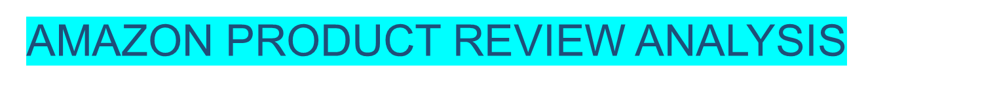

# STEPS INVOLVED:
- PREPROCESSING AND CLEANING
- EXPLORATORY DATA ANALYSIS ( TABLEAU )
- SENTIMENT ANALYSIS
- TEXT CLASSIFICATION


## MOUNTING DRIVE

In [1]:
"""# Mounting google drive
from google.colab import drive
drive.mount('/content/gdrive')"""

"# Mounting google drive\nfrom google.colab import drive\ndrive.mount('/content/gdrive')"

## IMPORTING LIBRARIES

In [2]:
import json                                        # to work with json file
import pandas as pd                                # to work with dataframes
import numpy as np                                 # to work with numpy arrays
import gzip                                        # to extract work file from zip file
import nltk                                        # working with nlp algorithms
from nltk.sentiment import SentimentIntensityAnalyzer  # To predict the sentiments based on the text
from tqdm.notebook import tqdm                     # library for adding progress bar
import sklearn                                     # to working with machine learning algorithms
from sklearn.linear_model import LogisticRegression  # Classification algorithm
from sklearn.feature_extraction.text import TfidfVectorizer # To convert text to numerical based on tfidf score
from nltk.corpus import stopwords                  # to detect stopwords
import re                                          # To remove the unwanted text
from sklearn.metrics import classification_report  # Classification report
from sklearn.metrics import accuracy_score         # evaluation metric
from sklearn.metrics import f1_score               # evaluation metric
from sklearn.metrics import recall_score           # evaluation metric
from sklearn.metrics import precision_score        # evaluation metric
from sklearn.model_selection import train_test_split # train test split
import time                                        # to check the processing time
from sklearn.preprocessing import LabelEncoder     # To convert categorical to numerical
import warnings
warnings.filterwarnings('ignore')                  # To ignore the warnings
from sklearn.model_selection import StratifiedKFold # Splitting
from sklearn.naive_bayes import MultinomialNB       # Naive bayes algorithm
import matplotlib.pyplot as plt                     # Visualization tool
import seaborn as sns                               # Visualization tool
from statsmodels.tsa.seasonal import seasonal_decompose            # Time series components
from statsmodels.tsa.stattools import adfuller                      # To find the stationarity of the data
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf       # To plot ACF and PACF plots
from statsmodels.tsa.arima.model import ARIMA                       # To build the ARIMA model
from sklearn.metrics import mean_squared_error                      # To check the mean square error                                      
from statsmodels.tsa.statespace.sarimax import SARIMAX              # To build the sarimax model
from sklearn.neighbors import NearestNeighbors                      # KNN algorithm
from sklearn.metrics.pairwise import cosine_similarity              # 
import scipy.sparse
from scipy.sparse import csr_matrix                                 # Correlation Matrix
from scipy.sparse.linalg import svds
from sklearn.preprocessing import MinMaxScaler, StandardScaler      # For Scaling the data
from sklearn.cluster import KMeans                                  # For Cluster Formation  
from sklearn.feature_extraction.text import CountVectorizer         # For Vectorisation
from wordcloud import WordCloud, STOPWORDS                          # For Word Cloud
from sklearn import metrics                                         # For Matrics Algorithms
from sklearn.metrics import classification_report                   # For Classification Evaluation Report
from datetime import datetime, timedelta,date
from sklearn.metrics import confusion_matrix                        # It shows the tabel of probability values
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from wordcloud import WordCloud
from nltk.corpus import stopwords
nltk.download('stopwords')                                         # Download the NLTK stopwords corpus 
stopwords = set(stopwords.words('english'))                        # Load the stopwords list

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\GAMA\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## CONVERTING THE FILE FROM JSON TO DATAFRAME

### Storing Meta data in df1

In [3]:
import pandas as pd
import json
import gzip

meta = []
with gzip.open(r"C:\Users\GAMA\Downloads\meta_All_Beauty.json.gz", 'r') as file:
    for line in file:
        meta.append(json.loads(line))

df1 = pd.DataFrame(meta)


### Storing All_beauty data set in df2 

In [4]:

all_beauty = []
with gzip.open(r"C:\Users\GAMA\Downloads\All_Beauty.json.gz", 'r') as file:
    for line in file:
        all_beauty.append(json.loads(line))

df2 = pd.DataFrame(all_beauty)


### DATA EXPLORATION ( Meta Data - df1)

### Checking shape

In [5]:
print('Rows in meta dataset :','\t',df1.shape[0],'\n')
print('Columns in meta dataset :','\t',df1.shape[1])

Rows in meta dataset : 	 32892 

Columns in meta dataset : 	 19


In [6]:
df1.head()

,category,tech1,description,fit,title,also_buy,tech2,brand,feature,rank,also_view,details,main_cat,similar_item,date,price,asin,imageURL,imageURLHighRes
0,[],,[Loud 'N Clear Personal Sound Amplifier allows...,,Loud 'N Clear&trade; Personal Sound Amplifier,[],,idea village,[],"2,938,573 in Beauty & Personal Care (",[],{'ASIN: ': '6546546450'},All Beauty,,,,6546546450,[],[]
1,[],,[No7 Lift & Luminate Triple Action Serum 50ml ...,,No7 Lift &amp; Luminate Triple Action Serum 50...,"[B01E7LCSL6, B008X5RVME]",,,[],"872,854 in Beauty & Personal Care (",[],"{'Shipping Weight:': '0.3 ounces (', 'ASIN: ':...",All Beauty,"class=""a-bordered a-horizontal-stripes a-spa...",,$44.99,7178680776,[],[]
2,[],,[No7 Stay Perfect Foundation now stays perfect...,,No7 Stay Perfect Foundation Cool Vanilla by No7,[],,No7,[],"956,696 in Beauty & Personal Care (","[B01B8BR0O8, B01B8BR0NO, B014MHXXM8]","{'Shipping Weight:': '3.5 ounces (', 'ASIN: ':...",All Beauty,,,$28.76,7250468162,[],[]
3,[],,[],,Wella Koleston Perfect Hair Colour 44/44 Mediu...,[B0041PBXX8],,,[],"1,870,258 in Beauty & Personal Care (",[],"{' Item Weight: ': '1.76 ounces', 'Sh...",All Beauty,,,,7367905066,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...
4,[],,[Lacto Calamine Skin Balance Daily Nourishing ...,,Lacto Calamine Skin Balance Oil control 120 ml...,[],,Pirmal Healthcare,[],"67,701 in Beauty & Personal Care (","[3254895630, B007VL1D9S, B00EH9A0RI, B0773MBG4...","{'Shipping Weight:': '12 ounces (', 'ASIN: ': ...",All Beauty,,,$12.15,7414204790,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...


In [7]:
df1.tail()

,category,tech1,description,fit,title,also_buy,tech2,brand,feature,rank,also_view,details,main_cat,similar_item,date,price,asin,imageURL,imageURLHighRes
32887,[],,[],,"Barielle Pro Textured Grip Cuticle Nipper, Purple",[],,,[],"2,145,325 in Beauty & Personal Care (",[],{'ASIN: ': 'B01HIWLLUK'},All Beauty,,,$9.95,B01HIWLLUK,[],[]
32888,[],,[],,(Buy 3 Get 1 Free) Salon Perfect Eye Makeup Co...,[],,Salon Perfect,[],"1,639,713 in Beauty & Personal Care (",[],"{'ASIN: ': 'B01HJ1K3YK', 'UPC:': '671635851871'}",All Beauty,,,,B01HJ1K3YK,[],[]
32889,[],,[],,NOW D-Mannose 500 mg - 120 Veg Capsules (Pack ...,"[B01KON9B4S, B079X3YFXS, B00M79OYS6, B000JN4CR...",,,[],"207,410 in Beauty & Personal Care (","[B01KON9B4S, B000JN4CR0, B071ZHMRHS, B01HJ84TN...","{'Shipping Weight:': '1 pounds (', 'ASIN: ': '...",All Beauty,,,$55.63,B01HJ84SGM,[],[]
32890,[],,[Brand new and high quality<br> Enables fast v...,,12 White Feather Shuttlecocks Birdies Badminto...,[],,GBSTORE,[],"965,673 in Beauty & Personal Care (",[],"{'Shipping Weight:': '4.8 ounces (', 'ASIN: ':...",All Beauty,,,$12.99,B01HJASD20,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...
32891,[],,[],,FESHFEN Scrunchy Scrunchies Synthetic Hair Bun...,"[B01HJEGQ6Q, B01L66EYCG, B00H7YZ7HI, B00CHKKWZ...",,,[],"478,123 in Beauty & Personal Care (","[B06XNM7CGD, B071D7TMQS]","{' Item Weight: ': '1.12 ounces', 'Sh...",All Beauty,,,,B01HJEGTYK,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...


In [8]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32892 entries, 0 to 32891
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   category         32892 non-null  object
 1   tech1            32892 non-null  object
 2   description      32892 non-null  object
 3   fit              32892 non-null  object
 4   title            32892 non-null  object
 5   also_buy         32892 non-null  object
 6   tech2            32892 non-null  object
 7   brand            32892 non-null  object
 8   feature          32892 non-null  object
 9   rank             32892 non-null  object
 10  also_view        32892 non-null  object
 11  details          32892 non-null  object
 12  main_cat         32892 non-null  object
 13  similar_item     32892 non-null  object
 14  date             32892 non-null  object
 15  price            32892 non-null  object
 16  asin             32892 non-null  object
 17  imageURL         32892 non-null

In [9]:
df1.isnull().sum()

category           0
tech1              0
description        0
fit                0
title              0
also_buy           0
tech2              0
brand              0
feature            0
rank               0
also_view          0
details            0
main_cat           0
similar_item       0
date               0
price              0
asin               0
imageURL           0
imageURLHighRes    0
dtype: int64

### Feature selection for meta data

In [10]:
data2 = df1[['asin','brand', 'title', 'price', 'rank']]
data2.head()

,asin,brand,title,price,rank
0,6546546450,idea village,Loud 'N Clear&trade; Personal Sound Amplifier,,"2,938,573 in Beauty & Personal Care ("
1,7178680776,,No7 Lift &amp; Luminate Triple Action Serum 50...,$44.99,"872,854 in Beauty & Personal Care ("
2,7250468162,No7,No7 Stay Perfect Foundation Cool Vanilla by No7,$28.76,"956,696 in Beauty & Personal Care ("
3,7367905066,,Wella Koleston Perfect Hair Colour 44/44 Mediu...,,"1,870,258 in Beauty & Personal Care ("
4,7414204790,Pirmal Healthcare,Lacto Calamine Skin Balance Oil control 120 ml...,$12.15,"67,701 in Beauty & Personal Care ("


## All Beauty (df2)

In [11]:
print('Rows in reviews dataset :','\t',df2.shape[0],'\n')
print('Columns in reviews dataset :','\t',df2.shape[1])

Rows in reviews dataset : 	 371345 

Columns in reviews dataset : 	 12


In [12]:
df2.head()

,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,vote,style,image
0,1.0,True,"02 19, 2015",A1V6B6TNIC10QE,0143026860,theodore j bigham,great,One Star,1424304000,NaN,NaN,NaN
1,4.0,True,"12 18, 2014",A2F5GHSXFQ0W6J,0143026860,Mary K. Byke,My husband wanted to reading about the Negro ...,... to reading about the Negro Baseball and th...,1418860800,NaN,NaN,NaN
2,4.0,True,"08 10, 2014",A1572GUYS7DGSR,0143026860,David G,"This book was very informative, covering all a...",Worth the Read,1407628800,NaN,NaN,NaN
3,5.0,True,"03 11, 2013",A1PSGLFK1NSVO,0143026860,TamB,I am already a baseball fan and knew a bit abo...,Good Read,1362960000,NaN,NaN,NaN
4,5.0,True,"12 25, 2011",A6IKXKZMTKGSC,0143026860,shoecanary,This was a good story of the Black leagues. I ...,"More than facts, a good story read!",1324771200,5,NaN,NaN


In [13]:
df2.tail()

,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,vote,style,image
371340,1.0,True,"07 20, 2017",A202DCI7TV1022,B01HJEGTYK,Sam,It was awful. It was super frizzy and I tried ...,It was super frizzy and I tried to comb it and...,1500508800,NaN,NaN,NaN
371341,5.0,True,"03 16, 2017",A3FSOR5IJOFIBE,B01HJEGTYK,TYW,I was skeptical about buying this. Worried it...,Awesome,1489622400,34,NaN,NaN
371342,5.0,True,"03 1, 2017",A1B5DK6CTP2P24,B01HJEGTYK,Norma Jennings,Makes me look good fast.,Five Stars,1488326400,46,NaN,NaN
371343,2.0,True,"02 21, 2017",A23OUYS5IRMJS9,B01HJEGTYK,Lee,Way lighter than photo\nNot mix blend of color...,Ok but color way off and volume as well,1487635200,NaN,NaN,NaN
371344,2.0,True,"12 15, 2016",A24KQ9RVU81L87,B01HJEGTYK,Season341,No return instructions/phone # in packaging. ...,Might return for a replacement if I could.,1481760000,NaN,NaN,NaN


In [14]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 371345 entries, 0 to 371344
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   overall         371345 non-null  float64
 1   verified        371345 non-null  bool   
 2   reviewTime      371345 non-null  object 
 3   reviewerID      371345 non-null  object 
 4   asin            371345 non-null  object 
 5   reviewerName    371307 non-null  object 
 6   reviewText      370946 non-null  object 
 7   summary         371139 non-null  object 
 8   unixReviewTime  371345 non-null  int64  
 9   vote            51899 non-null   object 
 10  style           125958 non-null  object 
 11  image           8391 non-null    object 
dtypes: bool(1), float64(1), int64(1), object(9)
memory usage: 31.5+ MB


In [15]:
df2.isnull().sum()

overall                0
verified               0
reviewTime             0
reviewerID             0
asin                   0
reviewerName          38
reviewText           399
summary              206
unixReviewTime         0
vote              319446
style             245387
image             362954
dtype: int64

### Feature selection for All beauty dataset (df2)

In [16]:
data1 = df2[['asin','reviewerID','reviewerName', 'overall', 'reviewText', 'reviewTime', 'verified', 'summary']]

In [17]:
data1.head(6)

,asin,reviewerID,reviewerName,overall,reviewText,reviewTime,verified,summary
0,0143026860,A1V6B6TNIC10QE,theodore j bigham,1.0,great,"02 19, 2015",True,One Star
1,0143026860,A2F5GHSXFQ0W6J,Mary K. Byke,4.0,My husband wanted to reading about the Negro ...,"12 18, 2014",True,... to reading about the Negro Baseball and th...
2,0143026860,A1572GUYS7DGSR,David G,4.0,"This book was very informative, covering all a...","08 10, 2014",True,Worth the Read
3,0143026860,A1PSGLFK1NSVO,TamB,5.0,I am already a baseball fan and knew a bit abo...,"03 11, 2013",True,Good Read
4,0143026860,A6IKXKZMTKGSC,shoecanary,5.0,This was a good story of the Black leagues. I ...,"12 25, 2011",True,"More than facts, a good story read!"
5,0143026860,A36NF437WZLQ9E,W. Powell,5.0,Today I gave a book about the Negro Leagues of...,"02 26, 2010",False,The Gift of Black Baseball


# Merging the data set on common column "asin"

In [18]:
M_data = pd.merge(data1, data2, on = 'asin')
M_data.head(3)

,asin,reviewerID,reviewerName,overall,reviewText,reviewTime,verified,summary,brand,title,price,rank
0,7414204790,A5TA1NJOC0PJ5,Amazon Customer,5.0,Excellent very good,"03 10, 2016",True,Five Stars,Pirmal Healthcare,Lacto Calamine Skin Balance Oil control 120 ml...,$12.15,"67,701 in Beauty & Personal Care ("
1,7414204790,A1TJICB7VLGQKL,LH,5.0,Great product,"09 1, 2015",True,Five Stars,Pirmal Healthcare,Lacto Calamine Skin Balance Oil control 120 ml...,$12.15,"67,701 in Beauty & Personal Care ("
2,7414204790,A80M2286B7STE,dolly,5.0,Magical,"10 3, 2014",True,Five Stars,Pirmal Healthcare,Lacto Calamine Skin Balance Oil control 120 ml...,$12.15,"67,701 in Beauty & Personal Care ("


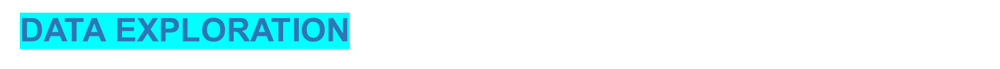

### Checking Shape of dataset

In [19]:
print('Rows in new dataset :','\t',M_data.shape[0],'\n')
print('Columns in new dataset :','\t',M_data.shape[1])

Rows in new dataset : 	 382532 

Columns in new dataset : 	 12


### Checking description

In [20]:
M_data.describe()

,overall
count,382532.000000
mean,4.109175
std,1.363348
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


### Checking information of dataset

In [21]:
M_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 382532 entries, 0 to 382531
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   asin          382532 non-null  object 
 1   reviewerID    382532 non-null  object 
 2   reviewerName  382493 non-null  object 
 3   overall       382532 non-null  float64
 4   reviewText    382132 non-null  object 
 5   reviewTime    382532 non-null  object 
 6   verified      382532 non-null  bool   
 7   summary       382320 non-null  object 
 8   brand         382532 non-null  object 
 9   title         382532 non-null  object 
 10  price         382532 non-null  object 
 11  rank          382532 non-null  object 
dtypes: bool(1), float64(1), object(10)
memory usage: 35.4+ MB


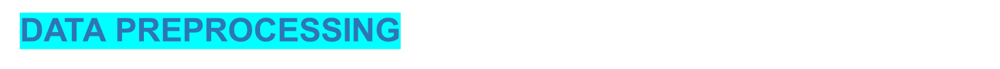

### Removing the duplicates

dupli=df.drop_duplicates(["reviewText","asin","reviewerName"], keep = "last")

duplicate_rows = df[df.duplicated(keep=False)]

### Checking null values

In [22]:
M_data.isnull().sum()

asin              0
reviewerID        0
reviewerName     39
overall           0
reviewText      400
reviewTime        0
verified          0
summary         212
brand             0
title             0
price             0
rank              0
dtype: int64

### Replace blank spaces with Nan 

In [23]:
M_data.replace('', np.nan, inplace=True)

In [24]:
M_data.isnull().sum()

asin                 0
reviewerID           0
reviewerName        39
overall              0
reviewText         400
reviewTime           0
verified             0
summary            212
brand            87553
title               16
price           183427
rank                 0
dtype: int64

In [25]:
M_data.sample(10)

,asin,reviewerID,reviewerName,overall,reviewText,reviewTime,verified,summary,brand,title,price,rank
138145,B007EITOSK,A36CA1QOA2VEW6,michelle adams,5.0,I use them in a lay down bed so I didn't bothe...,"07 22, 2016",True,Perfect goggles!,Super Sunnies,Super Sunnies Evo Flex Flexible - Random Color...,$3.90,575 in Beauty & Personal Care (
48044,B000GLRREU,A20RD2CBV59QZN,Jannie,5.0,This ultra water flosser is an effective tool ...,"06 13, 2014",True,Good Job!,Waterpik,Waterpik Ultra Water Flosser,NaN,"20,356 in Beauty &amp; Personal Care ("
133669,B006LTTBMW,AYSLV9FTNR5TJ,Christine G,5.0,Perfect for making candles and lotion bars.,"03 1, 2015",True,Five Stars,Hansi Naturals,"Beeswax organic pastilles, white, 100% pure 16 oz",$14.45,"103,859 in Beauty & Personal Care ("
71473,B000XV745A,A22EOJ6XN7Q5J4,Justine,5.0,Always good deal and it works,"03 11, 2017",True,Five Stars,Albolene,Albolene Moisturizing Cleanser Fragrance Free ...,$21.50,"24,064 in Beauty & Personal Care ("
379591,B01FR6XI0K,A1WQ50074A51VQ,kirsten,3.0,nice color- kept orange red tones down- but I ...,"06 1, 2017",True,nice color- kept orange red tones down- but I ...,NaN,Organic Colour Systems Permanent Hair Colour 1...,NaN,"1,055,266 in Beauty & Personal Care ("
63062,B000RVNC0M,A2190V9C3CJCI8,Pauline K. Jones,5.0,This is by far the best hair cream I have ever...,"03 3, 2013",True,Best hair cream ever!!!,Garnier,"Garnier Fructis Style Soft Curl Cream, Strong,...",NaN,"1,741,686 in Beauty & Personal Care ("
247283,B012KPK5PW,A3CWZTLRSY4P8N,Nicole Roberts,5.0,"So, I was skeptical about this product. These ...","05 13, 2016",True,Great buy,Victoria Featherlight,Victoria Featherlight - Best Organic Weight Lo...,NaN,"426,222 in Beauty & Personal Care ("
341523,B00L2QVAB4,ANDMBPJ31PXCZ,Mary M. Lott,1.0,Cheap and flimsy. Not curved enough and most o...,"08 25, 2015",True,Cheap flimsy product,Burmax,DL 3pk French C Triple Tip Smile Line Tool Pin...,$11.58,"466,377 in Beauty & Personal Care ("
18648,B00016WULK,A2OTP9DL8A8F9T,TC,1.0,I bought this after we moved to the desert. Th...,"09 23, 2014",True,Terrible!!!! My face feels tight and dry!!!,Avalon,Avalon Organics Vitamin C Renewal Moisture Plu...,NaN,"393,444 in Beauty & Personal Care ("
366511,B018665SJ2,A2OMXBLT33X7WL,ANMZ,2.0,The powder dries clear. Its whiter than the a...,"03 17, 2018",True,The powder dries clear. Its whiter than the ad...,Cancan,"ANC DIP Powder System Ruby Glitter #43, 2oz",$22.79,"446,463 in Beauty & Personal Care ("



### 1.Create def function to remove $ sign 
### 2.imputing Nan with median value in price column.

In [26]:
def convert_price(val):
    try:
        return float(val.replace('$', ''))
    except:
        return np.nan

M_data['price'] = M_data['price'].apply(convert_price)

median_price = M_data['price'].median()

M_data['price'] = M_data['price'].fillna(median_price)

In [27]:
M_data.sample(5)

,asin,reviewerID,reviewerName,overall,reviewText,reviewTime,verified,summary,brand,title,price,rank
280205,B01BI8YFAS,A13C1OW7V3KLP5,Janet Wooten,4.0,"Very good, stays on no lifting.","07 21, 2017",True,Four Stars,mia secret,Mia Secret Acrylic Powder Multi Balance Natura...,13.95,"20,167 in Beauty & Personal Care ("
33583,B0009PJRMS,A1G3ATHPA3UEJI,Roberta Bowler,1.0,This product contians LYE... that's what sapon...,"04 7, 2008",False,"100% pure, ya right!",Olivella,Bar Soap 100% Virgin Olive Oil Face &amp; Body...,3.49,"502,155 in Beauty & Personal Care ("
168239,B00CZH3LQG,A1E5WXNTI7EO2A,Sarah B.,5.0,"This is a fantastic electric, rechargable toot...","11 18, 2013",False,It's like getting your teeth professionally cl...,Crest,"Crest + Oral-B Professional Daily Clean Kit, 1...",12.00,"1,787,322 in Beauty & Personal Care ("
317859,B0019Z8HN2,A3QD5RB2KWL487,Shannon,5.0,Difficult to find this product in stores. Happ...,"04 26, 2011",True,Makeup Remover,Olay,"Olay Mascara and Makeup Remover, 4.5 Ounce (Pa...",12.00,"2,072,140 in Beauty & Personal Care ("
218492,B00RNKER4U,A2884VQ54HLP5,Melissa,5.0,Great replacement for our old cape...this is a...,"05 24, 2016",True,Five Stars,Icarus,Icarus Icarus Black Nylon Hair Styling Salon C...,12.99,"70,532 in Beauty & Personal Care ("


In [28]:
# EXTRACTING RANK FROM RANK COLUMN

In [29]:
M_data['rank'] = M_data['rank'].str.replace(',', '')  # Remove commas
M_data['rank'] = M_data['rank'].str.extract('(\d+)', expand=False) 


In [30]:
M_data.head()

,asin,reviewerID,reviewerName,overall,reviewText,reviewTime,verified,summary,brand,title,price,rank
0,7414204790,A5TA1NJOC0PJ5,Amazon Customer,5.0,Excellent very good,"03 10, 2016",True,Five Stars,Pirmal Healthcare,Lacto Calamine Skin Balance Oil control 120 ml...,12.15,67701
1,7414204790,A1TJICB7VLGQKL,LH,5.0,Great product,"09 1, 2015",True,Five Stars,Pirmal Healthcare,Lacto Calamine Skin Balance Oil control 120 ml...,12.15,67701
2,7414204790,A80M2286B7STE,dolly,5.0,Magical,"10 3, 2014",True,Five Stars,Pirmal Healthcare,Lacto Calamine Skin Balance Oil control 120 ml...,12.15,67701
3,7414204790,A2TM2MAA8IT34U,Jack Warn,5.0,Excellent!!!,"08 7, 2014",True,Five Stars,Pirmal Healthcare,Lacto Calamine Skin Balance Oil control 120 ml...,12.15,67701
4,7414204790,AQGWT465GTEJG,Chitralekha Tulal,4.0,I do like the product a lot...I had bought the...,"06 14, 2014",True,Very pricey,Pirmal Healthcare,Lacto Calamine Skin Balance Oil control 120 ml...,12.15,67701


In [31]:
M_data["rank"].isnull().sum()

4465

In [32]:
# changing datatype
M_data["overall"]=M_data["overall"].astype(int)

In [33]:
M_data["rank"].sort_values(ascending =True).unique()

array(['100000', '1000031', '1000053', ..., '999963', '999981', nan],
      dtype=object)

In [34]:
# Fill null values with a default rank value
default_rank = -1
M_data['rank'].fillna(default_rank, inplace=True)

In [35]:
M_data["rank"]=M_data["rank"].astype(int)

In [36]:
 M_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 382532 entries, 0 to 382531
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   asin          382532 non-null  object 
 1   reviewerID    382532 non-null  object 
 2   reviewerName  382493 non-null  object 
 3   overall       382532 non-null  int32  
 4   reviewText    382132 non-null  object 
 5   reviewTime    382532 non-null  object 
 6   verified      382532 non-null  bool   
 7   summary       382320 non-null  object 
 8   brand         294979 non-null  object 
 9   title         382516 non-null  object 
 10  price         382532 non-null  float64
 11  rank          382532 non-null  int32  
dtypes: bool(1), float64(1), int32(2), object(8)
memory usage: 32.5+ MB


In [37]:
M_data['reviewTime'] = pd.to_datetime(M_data['reviewTime'])

### Checking null values

In [38]:
M_data.isnull().sum()

asin                0
reviewerID          0
reviewerName       39
overall             0
reviewText        400
reviewTime          0
verified            0
summary           212
brand           87553
title              16
price               0
rank                0
dtype: int64

### Drop remaining Nan from other columns and again check null values

In [39]:
M_data.dropna(subset=['reviewerName', 'reviewText', 'title'], inplace=True)

In [40]:
M_data.dropna(subset=["summary"], inplace=True)

In [41]:
M_data.isnull().sum()

asin                0
reviewerID          0
reviewerName        0
overall             0
reviewText          0
reviewTime          0
verified            0
summary             0
brand           87325
title               0
price               0
rank                0
dtype: int64

In [42]:
# Checking top 5 titles and if they have null values in brand column

In [43]:
top5=M_data["title"].value_counts().sort_values(ascending=False).head(5).index

In [44]:
top5

Index(['Waterpik Ultra Water Flosser',
       'Astra Platinum Double Edge Safety Razor Blades ,100 Blades (20 x 5)',
       'Panasonic Bikini Shaper and Trimmer for Women ES246AC; Compact; Portable Design with Adjustable Trim Settings; Battery Operated',
       'Bali Secrets Natural Deodorant - Organic &amp; Vegan - For Women &amp; Men - All Day Fresh - Strong &amp; Reliable Protection - 2.5 fl.oz/75ml [Scent: Sandalwood]',
       'Braun Clean &amp; Renew Refill Cartridges CCR - 2 Count (Packaging May Vary)'],
      dtype='object')

In [45]:
M_data[M_data["title"].isin(top5)]

,asin,reviewerID,reviewerName,overall,reviewText,reviewTime,verified,summary,brand,title,price,rank
559,B000050FDY,A1O0UZWSZPRNLJ,J. Garrett,3,It is indeed a great razor as others have ment...,2004-02-22,False,Great Shaver...Rip OFF for Refills,Braun,Braun Clean &amp; Renew Refill Cartridges CCR ...,11.94,1028
560,B000050FDY,A1O0UZWSZPRNLJ,J. Garrett,3,It is indeed a great razor as others have ment...,2004-02-22,False,Great Shaver...Rip OFF for Refills,Braun,Braun Clean &amp; Renew Refill Cartridges CCR ...,11.94,1028
561,B000050FDY,A1W0PMHGAB4N5B,Amazon Customer,4,"As some other reviewers have suggested, this i...",2003-12-11,False,Great Shaver - Pricey Refills,Braun,Braun Clean &amp; Renew Refill Cartridges CCR ...,11.94,1028
562,B000050FDY,A1W0PMHGAB4N5B,Amazon Customer,4,"As some other reviewers have suggested, this i...",2003-12-11,False,Great Shaver - Pricey Refills,Braun,Braun Clean &amp; Renew Refill Cartridges CCR ...,11.94,1028
563,B000050FDY,A1M0VEHPQMUXW7,John S. Brofka,5,I've been buying the two cartridge refill set ...,2003-11-30,False,Retails for $19.99? Where and since when?,Braun,Braun Clean &amp; Renew Refill Cartridges CCR ...,11.94,1028
...,...,...,...,...,...,...,...,...,...,...,...,...
296205,B01DKQAXC0,A4V3S90H5OZTV,Michael,5,I wanted a to try a different vegan deodorant ...,2018-09-21,True,"Very Effective, but odd",NaN,Bali Secrets Natural Deodorant - Organic &amp;...,12.00,152867
296206,B01DKQAXC0,A32OQFYMJ18HD6,Sean,5,I love this deodorant it works just like Degre...,2018-09-21,True,Works as intended!,NaN,Bali Secrets Natural Deodorant - Organic &amp;...,12.00,152867
296207,B01DKQAXC0,ALUZH689LQE6K,LeAndra M.,4,Very good roll on! I like that there is no whi...,2018-09-21,True,Fresh Scent deodorant,NaN,Bali Secrets Natural Deodorant - Organic &amp;...,12.00,152867
328201,B00BXR0SFG,A3EATLL9FW7DJL,Jay J,4,Works graphics but pricey.,2018-04-13,True,Four Stars,Braun,Braun Clean &amp; Renew Refill Cartridges CCR ...,11.94,853


In [46]:
M_data.loc[M_data['title'] == 'Bali Secrets Natural Deodorant - Organic &amp; Vegan - For Women &amp; Men - All Day Fresh - Strong &amp; Reliable Protection - 2.5 fl.oz/75ml [Scent: Sandalwood]', 'brand'] = 'Bali Secrets'

In [47]:
M_data[M_data["title"].isin(top5)]

,asin,reviewerID,reviewerName,overall,reviewText,reviewTime,verified,summary,brand,title,price,rank
559,B000050FDY,A1O0UZWSZPRNLJ,J. Garrett,3,It is indeed a great razor as others have ment...,2004-02-22,False,Great Shaver...Rip OFF for Refills,Braun,Braun Clean &amp; Renew Refill Cartridges CCR ...,11.94,1028
560,B000050FDY,A1O0UZWSZPRNLJ,J. Garrett,3,It is indeed a great razor as others have ment...,2004-02-22,False,Great Shaver...Rip OFF for Refills,Braun,Braun Clean &amp; Renew Refill Cartridges CCR ...,11.94,1028
561,B000050FDY,A1W0PMHGAB4N5B,Amazon Customer,4,"As some other reviewers have suggested, this i...",2003-12-11,False,Great Shaver - Pricey Refills,Braun,Braun Clean &amp; Renew Refill Cartridges CCR ...,11.94,1028
562,B000050FDY,A1W0PMHGAB4N5B,Amazon Customer,4,"As some other reviewers have suggested, this i...",2003-12-11,False,Great Shaver - Pricey Refills,Braun,Braun Clean &amp; Renew Refill Cartridges CCR ...,11.94,1028
563,B000050FDY,A1M0VEHPQMUXW7,John S. Brofka,5,I've been buying the two cartridge refill set ...,2003-11-30,False,Retails for $19.99? Where and since when?,Braun,Braun Clean &amp; Renew Refill Cartridges CCR ...,11.94,1028
...,...,...,...,...,...,...,...,...,...,...,...,...
296205,B01DKQAXC0,A4V3S90H5OZTV,Michael,5,I wanted a to try a different vegan deodorant ...,2018-09-21,True,"Very Effective, but odd",Bali Secrets,Bali Secrets Natural Deodorant - Organic &amp;...,12.00,152867
296206,B01DKQAXC0,A32OQFYMJ18HD6,Sean,5,I love this deodorant it works just like Degre...,2018-09-21,True,Works as intended!,Bali Secrets,Bali Secrets Natural Deodorant - Organic &amp;...,12.00,152867
296207,B01DKQAXC0,ALUZH689LQE6K,LeAndra M.,4,Very good roll on! I like that there is no whi...,2018-09-21,True,Fresh Scent deodorant,Bali Secrets,Bali Secrets Natural Deodorant - Organic &amp;...,12.00,152867
328201,B00BXR0SFG,A3EATLL9FW7DJL,Jay J,4,Works graphics but pricey.,2018-04-13,True,Four Stars,Braun,Braun Clean &amp; Renew Refill Cartridges CCR ...,11.94,853


In [48]:
top10=M_data["title"].value_counts().sort_values(ascending=False).head(10).index
top10_b = M_data.loc[M_data['title'].isin(top10), 'brand']
top10_b.unique()

array(['Braun', 'Panasonic', 'Helen Of Troy', 'Waterpik',
       'Bath & Body Works', 'Astra', 'Aquaphor', 'Italia-Deluxe',
       'Pre de Provence', 'Bali Secrets'], dtype=object)

### Imputing Null values in "Brand Column"

In [49]:
M_data['brand'].fillna('Unknown', inplace=True)

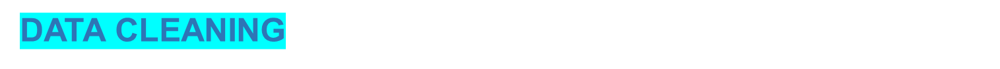

### Creating cleaning function

In [50]:
def cleaning(text):
    text = re.sub("[^0-9A-Za-z\-]+", " ", text) 
    text = re.sub("(?<!\w)\d+", "", text)
    text = re.sub("-(?!\w)", "", text)
    text = " ".join(text.split())
    text = text.lower()
    return text

In [51]:
M_data["reviewText"] = M_data["reviewText"].apply(cleaning)

In [52]:
M_data["title"]=M_data["title"].apply(cleaning)

# Review Length
 Analyzing review length can provide some useful insights for businesses

In [53]:
review_lengths = []

for review in M_data["reviewText"]:
    length = len(review)
    review_lengths.append(length)

M_data['review_length'] = review_lengths

In [54]:
M_data

,asin,reviewerID,reviewerName,overall,reviewText,reviewTime,verified,summary,brand,title,price,rank,review_length
0,7414204790,A5TA1NJOC0PJ5,Amazon Customer,5,excellent very good,2016-03-10,True,Five Stars,Pirmal Healthcare,lacto calamine skin balance oil control ml pac...,12.15,67701,19
1,7414204790,A1TJICB7VLGQKL,LH,5,great product,2015-09-01,True,Five Stars,Pirmal Healthcare,lacto calamine skin balance oil control ml pac...,12.15,67701,13
2,7414204790,A80M2286B7STE,dolly,5,magical,2014-10-03,True,Five Stars,Pirmal Healthcare,lacto calamine skin balance oil control ml pac...,12.15,67701,7
3,7414204790,A2TM2MAA8IT34U,Jack Warn,5,excellent,2014-08-07,True,Five Stars,Pirmal Healthcare,lacto calamine skin balance oil control ml pac...,12.15,67701,9
4,7414204790,AQGWT465GTEJG,Chitralekha Tulal,4,i do like the product a lot i had bought them ...,2014-06-14,True,Very pricey,Pirmal Healthcare,lacto calamine skin balance oil control ml pac...,12.15,67701,196
...,...,...,...,...,...,...,...,...,...,...,...,...,...
382527,B01HJ84SGM,A2FZ7C9H14T5HZ,Kathy U,5,i have used this for a couple of years it work...,2017-10-03,True,Works great!,Unknown,now d-mannose mg veg capsules pack of,55.63,207410,108
382528,B01HJ84SGM,A1YQHF10YIMWOL,Sheila Willson,5,i ve battled uti s for most of my life after r...,2017-08-24,True,FREE OF UTI's!,Unknown,now d-mannose mg veg capsules pack of,55.63,207410,375
382529,B01HJ84SGM,A1IYJVHJSCR8DR,Marcus Y.,5,i have been using this for years and i believe...,2017-05-29,True,Great product. Very beneficial.,Unknown,now d-mannose mg veg capsules pack of,55.63,207410,166
382530,B01HJ84SGM,A7WHO9ZFPHU2B,David P. Birtwell,5,i think d-mannose nature s herbs cranberry who...,2017-05-09,True,Lifesavers...,Unknown,now d-mannose mg veg capsules pack of,55.63,207410,161


In [55]:
# converting dataframe to csv file

df.to_csv('All_Beauty_cleaned.csv', index=False)

df.shape

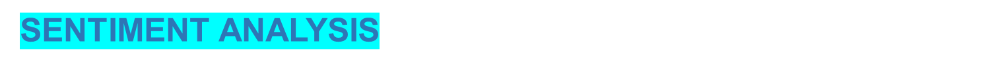

# Text Blob

In [56]:

from textblob import TextBlob

In [57]:
def getPolarity(text):
    return TextBlob(text).sentiment.polarity
M_data['polarity'] = M_data['reviewText'].apply(getPolarity)

In [59]:
def polarity_sentiment(polarity):
    
    '''Returns the sentiment of the polarity'''
    
    if polarity < 0:
        sentiment_type = 'Negative'
    elif polarity >= 0.1:
        sentiment_type = 'Positive'
    else:
        sentiment_type = 'Neutral'
        
    return sentiment_type

In [60]:
M_data['sentiment'] = M_data['polarity'].apply(polarity_sentiment)

In [61]:
M_data.sample(20)

,asin,reviewerID,reviewerName,overall,reviewText,reviewTime,verified,summary,brand,title,price,rank,review_length,polarity,sentiment
28496,B00028ORTK,A19USEO6M0JHTV,C. Albrizzio,5,i use it during winder time when the air is dr...,2012-12-10,True,great for your skin in winter time,Aubrey Organics,revitalizing therapy serum intensive anttioxid...,17.07,115073,134,0.077778,Neutral
186136,B00I9VZT1C,A3RWXA6KHRLHH7,Dale Nunnery,5,i am pleased,2018-07-26,True,I am pleased,Tanning Stickers,fleur de lis quot saints quot tanning stickers...,5.50,82621,12,0.500000,Positive
81466,B00167Y3Y0,APXNRK2CHEBV4,Kelly L. Love,5,this product is fantastic i put it on one side...,2009-05-28,False,Amazing product! Loyal customer.....,dead sea,premier dead sea biox intensive thermal beauty...,12.00,956983,301,0.088946,Neutral
376127,B01DND88LS,AGMIH9M23ZGQ3,Heartsmile,5,gift to brother in law,2018-02-08,True,Five Stars,Unknown,jovan white musk by jovan deodorant spray oz men,29.99,1159735,22,0.000000,Neutral
115768,B004BD9152,A1JP70QMYBXNRC,Jeremy Wong,4,i used it twice and also bought one for my fri...,2016-02-17,True,Love this and will keep to use it.,L'Oreal Paris,l or eacute al paris skincare hydrafresh toner...,5.37,167810,217,0.433333,Positive
185952,B00I4ZTFCM,A1PSM2RAG9BM9F,Amanda Covert,5,there is a lip on the back so that when mounti...,2015-02-25,True,Works,Saloniture,saloniture blow dryer amp hair iron holder sal...,23.99,93972,121,0.272222,Positive
88124,B001BOKR3E,A1D5IE1OL0SLZV,Casey Harris,5,i am a student at the staunton school of cosme...,2011-11-19,True,Pleased,CELEBRITY,celebrity debra manikin mk-d804,43.99,62694,478,0.087037,Neutral
130785,B006IB5T4W,A34QR9FOIFTN2G,Online shopper,5,this is a wonderful moisturizer it is quite gr...,2018-03-21,True,Wonderful moisturizer.,Aquaphor,aquaphor healing ointment advanced therapy ski...,11.29,65,72,0.800000,Positive
85353,B001AJ6YS2,A3D0T6EHDQREDJ,Cartoon lover,4,well i can t complain unlike you all i snatche...,2013-05-23,False,"Smooth, quiet. Beard trimmer cuts a little TOO...",Philips Norelco,philips norelco men s shaving system,14.74,288553,947,0.171812,Positive
42275,B000FEF1V4,A3TZGBNE7KXNTF,Mike G,3,there have been a lot of complaints about the ...,2007-08-09,True,Not Too Shabby,Philips Norelco,philips norelco t980 turbo vacuum trimmer,12.00,533473,1182,0.141888,Positive


- Polarity is a measure of sentiment intensity that ranges from -1 to +1, where negative values indicate negative sentiment, positive values indicate positive sentiment, and a value of 0 indicates a neutral sentiment.

In [62]:
M_data.isnull().sum()

asin             0
reviewerID       0
reviewerName     0
overall          0
reviewText       0
reviewTime       0
verified         0
summary          0
brand            0
title            0
price            0
rank             0
review_length    0
polarity         0
sentiment        0
dtype: int64

### converting the data into CSV file

M_data.to_csv("Cleaned_AllBeauty.csv",index=False)

### Read the data

In [63]:
df = pd.read_csv("Cleaned_AllBeauty.csv")
df.sample(32)

,asin,reviewerID,reviewerName,overall,reviewText,reviewTime,verified,summary,brand,title,price,rank,review_length,polarity,sentiment
46499,B000GLRREU,A2RTUHFU4EIW14,Mark Sepulveda,5,great seller product worked great,2015-08-31,True,Five Stars,Waterpik,waterpik ultra water flosser,12.00,20356,33,0.800000,Positive
27758,B000256MZA,A3398VRZNFDMQU,Lookin 4,5,i use this great little clutch to hold manicur...,2017-08-12,False,Great in the car,ZEFER,expandable wallet converts to tote bag fanny pack,12.00,1706042,163,0.261458,Positive
111727,B003FZGQFK,A2DA3MPN5QN378,Foot doctor,5,love this shampoo,2016-08-31,True,Five Stars,Kerastase,kerastase nutritive bain satin nutrition shamp...,20.98,5344,17,0.500000,Positive
63123,B000SOORBQ,A2EZPWAE8GGFGZ,William M. Palmer,4,i think it will work very well delivery servic...,2015-04-17,True,delivery service was excellent,Timm Medical,acticuf pack of,24.99,331585,61,0.600000,Positive
370464,B01B17ZIVQ,A2BTZJ7V1EBYFE,Maria Georgescu,5,ok ig,2017-03-09,True,Five Stars,Unknown,dolce amp gabbana light blue grapefruit and si...,69.99,698719,5,0.500000,Positive
309052,B01GR3P0VC,A34M33HXMKE0PW,Joshua,5,nice,2015-04-21,True,nice,Heart Stickers,body stickers hearts ct by heart stickers,3.93,373396,4,0.600000,Positive
229746,B00W259T7G,A22WD3LQLTBW15,Rebekah W.,5,honey almond is a good quality soap bar with s...,2018-06-28,True,"Good for price, compared to others",Pre de Provence,pre de provence artisanal french soap bar enri...,4.99,130823,232,0.366667,Positive
173948,B00ESZLEXK,A3LDI2WPQGL78N,Ka Lyd Eer,5,very exotic necklace received on time just wha...,2014-07-07,True,Exotic,HotEnergy,hotenergy bohemian retro chain multi stray lea...,3.00,537079,138,0.650000,Positive
72211,B000YB70PS,A1L54KF4YBPCID,Paul B.,4,use it on my beard and hair everyday,2016-05-01,True,Works great,KENT,kent the handmade comb fine and coarse toothed...,12.00,3273,36,-0.200000,Negative
173604,B00EP1N77I,A2SFT0DFWFQ5E0,Goddaughter,4,i really enjoy using this product when i first...,2017-09-09,True,I really enjoy using this product,SmellGood,african soft black soap tub lb,11.98,155295,513,0.181250,Positive


### checking null values

In [64]:
df.isnull().sum()              

asin               0
reviewerID         0
reviewerName      13
overall            0
reviewText       133
reviewTime         0
verified           0
summary            5
brand             15
title             16
price              0
rank               0
review_length      0
polarity           0
sentiment          0
dtype: int64

### Drop null values and again check null values 

In [65]:
df.dropna(inplace=True)

In [66]:
duplicate_rows = df.duplicated(keep=False)

# Get the duplicate rows
duplicate_data = df[duplicate_rows]

if not duplicate_data.empty:
    print("Duplicate rows found:")
    print(duplicate_data)
else:
    print("No duplicate rows found.")

Duplicate rows found:
              asin      reviewerID     reviewerName  overall  \
95      B000050B65  A2XGCE5UZK0DAG  Amazon Customer        5   
96      B000050B65  A2XGCE5UZK0DAG  Amazon Customer        5   
97      B000050B65   AM37QEJBT15TR        DirtRaven        5   
98      B000050B65   AM37QEJBT15TR        DirtRaven        5   
99      B000050B65  A1BAONZQ70R96D      Simon Gomez        5   
...            ...             ...              ...      ...   
353826  B0001KOPYG   AMUIY3U6NKE4Y      Susan Couch        5   
356850  B0001K0PPY    AMNKF64ZEKQV     Joann Fowler        5   
356851  B0001K0PPY    AMNKF64ZEKQV     Joann Fowler        5   
367169  B00014357U  A3NYDOKMV3T4G1          Mary M.        5   
367170  B00014357U  A3NYDOKMV3T4G1          Mary M.        5   

                                               reviewText  reviewTime  \
95      this razor replaced my several-year-old norelc...  2001-01-15   
96      this razor replaced my several-year-old norelc...  2001

In [67]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 381699 entries, 0 to 381880
Data columns (total 15 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   asin           381699 non-null  object 
 1   reviewerID     381699 non-null  object 
 2   reviewerName   381699 non-null  object 
 3   overall        381699 non-null  int64  
 4   reviewText     381699 non-null  object 
 5   reviewTime     381699 non-null  object 
 6   verified       381699 non-null  bool   
 7   summary        381699 non-null  object 
 8   brand          381699 non-null  object 
 9   title          381699 non-null  object 
 10  price          381699 non-null  float64
 11  rank           381699 non-null  int64  
 12  review_length  381699 non-null  int64  
 13  polarity       381699 non-null  float64
 14  sentiment      381699 non-null  object 
dtypes: bool(1), float64(2), int64(3), object(9)
memory usage: 44.0+ MB


In [68]:
df.drop_duplicates(keep='first', inplace=True)

In [69]:
df.shape

(356695, 15)

In [70]:
for i in df.columns:
    print(i,':',df[i].nunique())

asin : 32447
reviewerID : 318617
reviewerName : 217591
overall : 5
reviewText : 306893
reviewTime : 5282
verified : 2
summary : 180763
brand : 7859
title : 31876
price : 3523
rank : 31838
review_length : 2892
polarity : 44673
sentiment : 3


### Plot bar chart for Positive, Negative and Neutral Sentiment

We can see that most of the reviews are positive, and Neutral reviews are least in number.

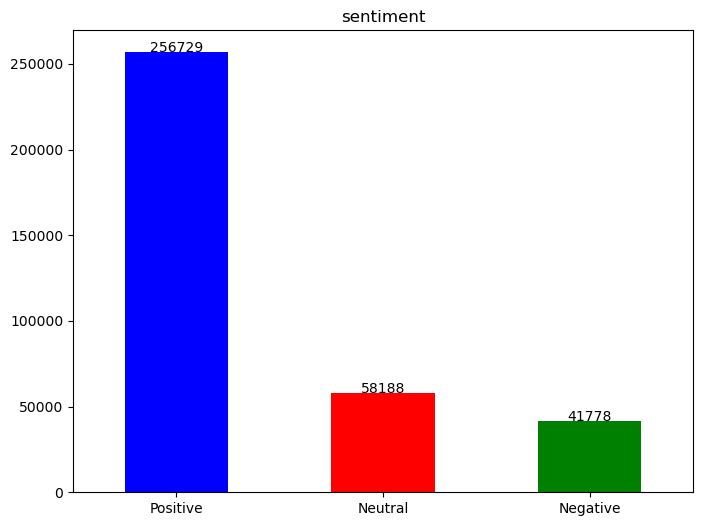

In [71]:
plt.figure(figsize=(8, 6))

colors = ['blue', 'red', 'green']
counts = df.sentiment.value_counts()
ax = counts.plot.bar(color=colors)
ax.set_title('sentiment')

# Adding count labels to the bars
for i, v in enumerate(counts):
    ax.text(i, v + 1, str(v), ha='center')

plt.xticks(rotation=0)

plt.show()



**Interpretation**: We can see that our target variable is imbalanced

## Seperating sentiments into 3 dataframes

In [72]:
pos_reviews = df[df['sentiment'] == 'Positive']
pos_text = pd.DataFrame(pos_reviews['reviewText'])

In [73]:
neg_reviews = df[df['sentiment'] == 'Negative']
neg_text = pd.DataFrame(neg_reviews['reviewText'])

In [74]:

neutral_reviews = df[df['sentiment'] == 'Neutral']
neutral_text = pd.DataFrame(neutral_reviews['reviewText'])

## Creating functions to create word clouds

### Word Cloud : Positive

In [75]:
def positive_reviews(df):
    pos_reviews = df[df['sentiment'] == 'Positive']
    global pos_text
    pos_text = pd.DataFrame(pos_reviews['reviewText'])
    return pos_text
     

In [76]:
def pos_wc(pos_text):
    wc = WordCloud(height=400, width=600, 
                 min_font_size=4, min_word_length=3,stopwords = stopwords, background_color='black',
                normalize_plurals=True, include_numbers=False, repeat = False) 
    text = " ".join(x for x in pos_text['reviewText'][:200000].astype(str))
    wc.generate(text)
    wc.to_file('positive_wordcloud.png')
    plt.figure(figsize=(40,20))
    plt.tight_layout(pad=0)
    plt.imshow(wc, interpolation='bilinear')
    plt.show()

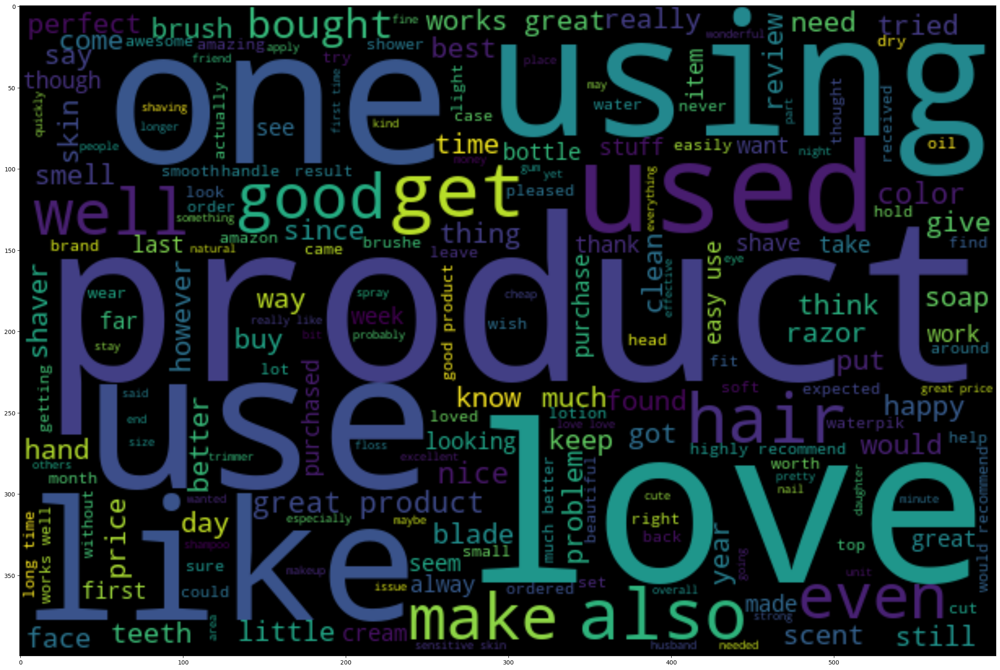

In [77]:
pos_wc(pos_text)

In [78]:

def neutral_reviews(df):
    neutral_reviews = df[df['sentiment'] == 'Neutral']
    global neutral_text
    neutral_text = pd.DataFrame(neutral_reviews['reviewText'])
    return neutral_text

In [79]:
def neutral_wc(neu_text):
    wc = WordCloud(height=400, width=600, 
                 min_font_size=4, min_word_length=3,stopwords = stopwords, background_color='black',
                normalize_plurals=True, include_numbers=False, repeat = False)
    text = " ".join(x for x in neu_text['reviewText'].astype(str))
    wc.generate(text)
    wc.to_file('neutral_wordcloud.png')
    plt.figure(figsize=(40,20))
    plt.tight_layout(pad=0)
    plt.imshow(wc, interpolation='bilinear')
    plt.show()
     

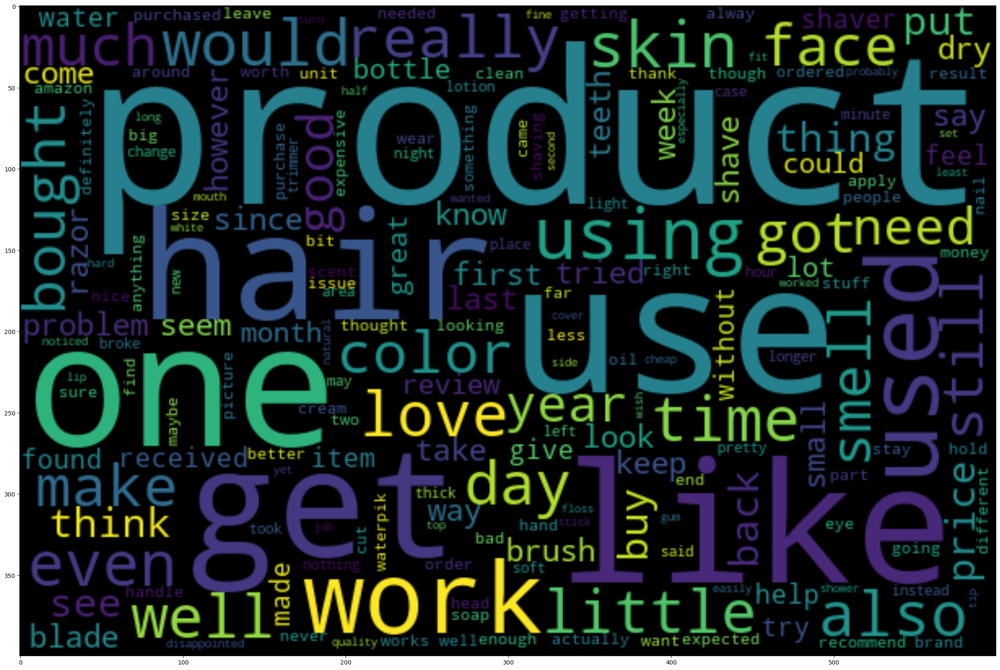

In [80]:

neutral_wc(neutral_text)

In [81]:
def negative_reviews(df):
    neg_reviews = df[df['sentiment'] == 'Negative']
    global neg_text
    neg_text = pd.DataFrame(neg_reviews['reviewText'])
    return neg_text

In [82]:
def neg_wc(neg_text):
    wc = WordCloud(height=400, width=600, 
                 min_font_size=4, min_word_length=3,stopwords = stopwords, background_color='black',
                normalize_plurals=True, include_numbers=False, repeat = False)
    text = " ".join(x for x in neg_text['reviewText'].astype(str))
    wc.generate(text)
    wc.to_file('negative_wordcloud.png')
    plt.figure(figsize=(40,20))
    plt.tight_layout(pad=0)
    plt.imshow(wc, interpolation='bilinear')
    plt.show()

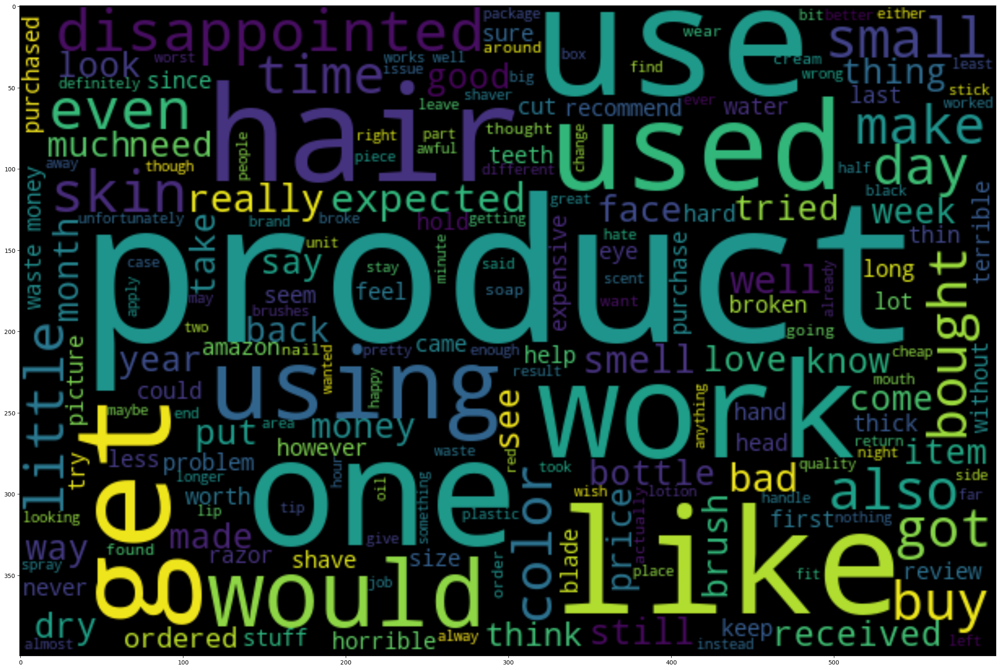

In [83]:

neg_wc(neg_text)

**Interpretation** : No proper conclusions can be made from the word cloud

## TOP FREQUENTLY OCCURING WORDS : Using Bigrams

In [84]:
review_pos = df[df['sentiment'] == 'Positive'][:20000]['reviewText']

In [85]:
review_neu = df[df['sentiment'] == 'Neutral']['reviewText']

In [86]:
review_neg = df[df['sentiment'] == 'Negative']['reviewText']

In [87]:
review_pos.dropna(inplace=True)

In [91]:

## custom function for ngram generation ##
def generate_ngrams(text, n_gram=1):
    token = [token for token in str(text).lower().split(" ") if token != "" if token not in stopwords_list]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

## custom function for horizontal bar chart ##
def horizontal_bar_chart(df, color):
    trace = go.Bar(
        y=df["word"].values[::-1],
        x=df["wordcount"].values[::-1],
        showlegend=False,
        orientation = 'h',
        marker=dict(
            color=color,
        ),
    )
    return trace

In [99]:
from collections import defaultdict
import plotly.graph_objs as go
import plotly.tools as tools
from plotly.offline import iplot

# Define stopwords_list (you can customize this list as per your requirements)
stopwords_list = ["and", "the", "is", "it", "of", "in", "this", "that", "are", "on"]
 

## Get the bar chart from positive reviews
freq_dict = defaultdict(int)
for sent in review_pos:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews
freq_dict = defaultdict(int)
for sent in review_neu:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative reviews
freq_dict = defaultdict(int)
for sent in review_neg:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]

trace2 = horizontal_bar_chart(fd_sorted.head(25), 'brown')

# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,horizontal_spacing=0.25,
                          subplot_titles=["Bigram plots of Positive reviews", 
                                          "Bigram plots of Neutral reviews",
                                          "Bigram plots of Negative reviews"
                                          ])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)


fig['layout'].update(height=1000, width=800, paper_bgcolor='rgb(233,233,233)', title="Bigram Plots")
iplot(fig, filename='word-plots')

C:\Users\GAMA\anaconda3\lib\site-packages\plotly\tools.py:460: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



The above graphs can clearly show the most occuring 2- word phrases for each sentiment

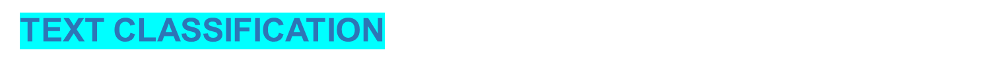

- The Reviews are divided into 3 classes i.e Positive , Negative and Neutral
- Based on these classes we'll perform Text Classification, where a review will be classified as Positive , Negative and Neutral
- This is also called as Sentiment Analysis, as through reviews we are predicting sentiments of the customers with respect to the brand purchased

In [100]:
test=df.loc[:,['reviewText','sentiment']]
test

,reviewText,sentiment
0,excellent very good,Positive
1,great product,Positive
2,magical,Positive
3,excellent,Positive
4,i do like the product a lot i had bought them ...,Positive
...,...,...
381876,i have used this for a couple of years it work...,Positive
381877,i ve battled uti s for most of my life after r...,Positive
381878,i have been using this for years and i believe...,Positive
381879,i think d-mannose nature s herbs cranberry who...,Positive


## LabelEncoding

In [101]:
from sklearn.preprocessing import LabelEncoder
label=LabelEncoder()

In [102]:
test['sentiment']=label.fit_transform(test['sentiment'])  
test

,reviewText,sentiment
0,excellent very good,2
1,great product,2
2,magical,2
3,excellent,2
4,i do like the product a lot i had bought them ...,2
...,...,...
381876,i have used this for a couple of years it work...,2
381877,i ve battled uti s for most of my life after r...,2
381878,i have been using this for years and i believe...,2
381879,i think d-mannose nature s herbs cranberry who...,2


### Spliting Our Data Into Training & Split test

In [103]:
X=test['reviewText']               
y=test['sentiment']
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=81)

In [104]:
print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)

(249686,) (107009,) (249686,) (107009,)


### TF-IDF (Term Frequency-Inverse Document Frequency)

In [105]:
from sklearn.feature_extraction.text import TfidfVectorizer


In [106]:
vectorizer = TfidfVectorizer(sublinear_tf=True, max_df=0.5, min_df=1,use_idf=True, smooth_idf=True)
X_train = vectorizer.fit_transform(X_train)  # Vectorizing the training data
X_test = vectorizer.transform(X_test)  # Vectorizing the test data


In [107]:
X_train.shape

(249686, 59073)

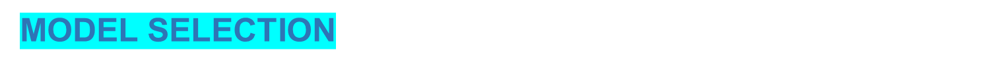

# Naive Bayes

In [108]:
from sklearn.metrics import plot_confusion_matrix
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB()

In [109]:
clf=clf.fit(X_train, y_train)  # Fitting the ML model
y_pred_nb = clf.predict(X_test)  # Predicting labels using the fitted model


In [110]:
from sklearn.metrics import accuracy_score,recall_score,f1_score,precision_score
print('accuracy:', accuracy_score(y_test, y_pred_nb))
print('recall:', recall_score(y_test, y_pred_nb, average='weighted'))
print('f1-score:', f1_score(y_test, y_pred_nb, average='weighted'))
print('precision:', precision_score(y_test, y_pred_nb, average='weighted'))


accuracy: 0.7306394789223336
recall: 0.7306394789223336
f1-score: 0.6284866340130968
precision: 0.7688300333687552


In [111]:
from sklearn.metrics import multilabel_confusion_matrix
multilabel_confusion_matrix(y_test,y_pred_nb) 

array([[[94399,    37],
        [11679,   894]],

       [[89461,    89],
        [17080,   379]],

       [[ 1334, 28698],
        [   65, 76912]]], dtype=int64)

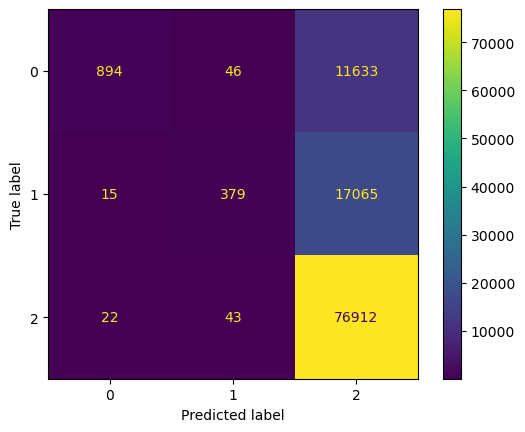

In [112]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(clf,X_test,y_test)

#### Storing accuracy score in a list

In [113]:
scores={"Naive Bayes":73}
scores

{'Naive Bayes': 73}

# LOGISTIC REGRESSION

In [114]:
lgr = LogisticRegression(multi_class='multinomial',max_iter=200, verbose=1)
# fit the model
lgr.fit(X_train,y_train)
y_pred_lgr = lgr.predict(X_test)

In [115]:
print('accuracy:', accuracy_score(y_test, y_pred_lgr))
print('recall:', recall_score(y_test, y_pred_lgr, average='weighted'))
print('f1-score:', f1_score(y_test, y_pred_lgr, average='weighted'))
print('precision:', precision_score(y_test, y_pred_lgr, average='weighted'))

accuracy: 0.8877477595342448
recall: 0.8877477595342448
f1-score: 0.8842882200501126
precision: 0.8825949280199771


## Checking if the model is Overfitting or not 

In [116]:
train_p = lgr.predict(X_train)
train_accuracy = accuracy_score(y_train, train_p)
print("Training Accuracy:", train_accuracy)

Training Accuracy: 0.9143203864053251


**The models isn't overfitting

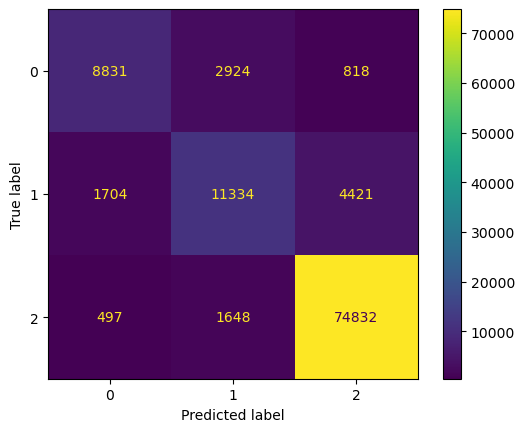

In [117]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(lgr,X_test,y_test)

In [118]:
scores["LogisticRegression"]=89

# DECISION TREE CLASSIFIER

In [119]:
dtc = DecisionTreeClassifier().fit(X_train, y_train)
y_pred_dtc = dtc.predict(X_test)

In [120]:
print('accuracy:', accuracy_score(y_test, y_pred_dtc))
print('recall:', recall_score(y_test, y_pred_dtc, average='weighted'))
print('f1-score:', f1_score(y_test, y_pred_dtc, average='weighted'))
print('precision:', precision_score(y_test, y_pred_dtc, average='weighted'))

accuracy: 0.8335934360661252
recall: 0.8335934360661252
f1-score: 0.8326202917472298
precision: 0.8317364157069664


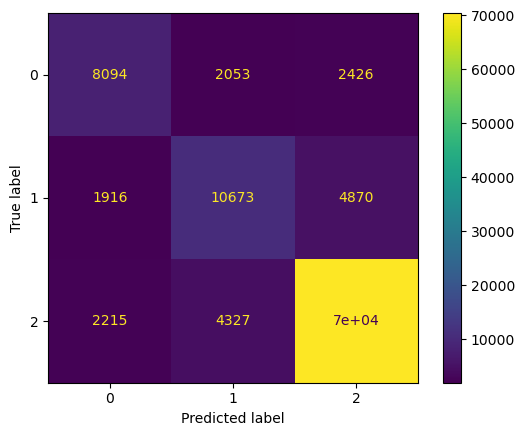

In [121]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(dtc,X_test,y_test)

In [122]:
dt_train= dtc.predict(X_train)
train_accuracy = accuracy_score(y_train, dt_train)
print("Training Accuracy:", train_accuracy)

Training Accuracy: 0.9999599496968192


*Our Model is Overfitting*

# BALANCED DATA

In [123]:
!pip install imblearn


[notice] A new release of pip is available: 23.0.1 -> 23.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [124]:
from imblearn.over_sampling import SMOTE

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=81)

# TF-IDF vectorization
vectorizer = TfidfVectorizer(sublinear_tf=True, max_df=0.5, min_df=1, use_idf=True, smooth_idf=True)
X_trainB = vectorizer.fit_transform(X_train)  # Vectorizing the training data
X_testB = vectorizer.transform(X_test)  # Vectorizing the test data

# Apply SMOTE oversampling to the training data
smt = SMOTE(random_state=0)
X_trainB, y_trainB = smt.fit_resample(X_trainB, y_train)

# Split the oversampled data into train and test sets
X_trainB, X_testB, y_trainB, y_testB = train_test_split(X_trainB, y_trainB, test_size=0.3, random_state=85)


#### Hyperparameter tuning

In [143]:
dtc_bal = DecisionTreeClassifier(max_depth = 8,min_samples_split=5,min_samples_leaf=1).fit(X_trainB, y_trainB)

In [144]:
y_pred2= dtc.predict(X_trainB)
train_accuracy = accuracy_score(y_trainB, y_pred2)
print("Training Accuracy:", train_accuracy)

Training Accuracy: 0.8659951944346573


In [145]:
y_predd2= dtc.predict(X_testB)
train_accuracy2 = accuracy_score(y_testB, y_predd2)
print("Training Accuracy:", train_accuracy2)

Training Accuracy: 0.8642266824085005


In [134]:
scores["DecisionTree"]= 86

*After balancing the data , the accuracy of the Model increased as well as the model doesn't overfit now*

# RANDOM FOREST CLASSIFIER

In [146]:
rfc = RandomForestClassifier(n_estimators=150,max_depth=6).fit(X_trainB, y_trainB)
y_pred_rfc = rfc.predict(X_testB)

In [147]:
print('accuracy:', accuracy_score(y_testB, y_pred_rfc))
print('recall:', recall_score(y_testB, y_pred_rfc, average='weighted'))
print('f1-score:', f1_score(y_testB, y_pred_rfc, average='weighted'))
print('precision:', precision_score(y_testB, y_pred_rfc, average='weighted'))

accuracy: 0.6478547630380092
recall: 0.6478547630380092
f1-score: 0.6488994664382977
precision: 0.6615485689785103


In [148]:
scores["Random Forest"]=64

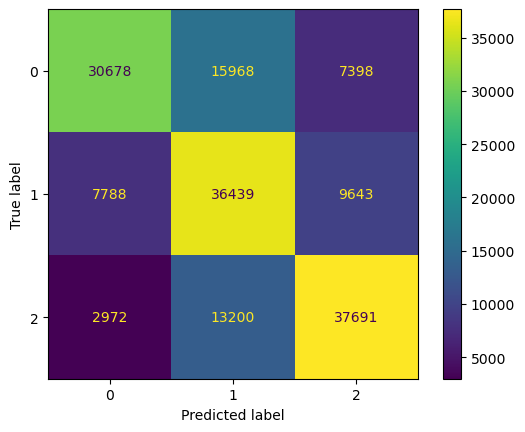

In [151]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(rfc,X_testB,y_testB)

# Logistic Regression

In [140]:
lgr = LogisticRegression(multi_class='multinomial',max_iter=200, verbose=1)
# fit the model
lgr=lgr.fit(X_trainB,y_trainB)
y_predB = lgr.predict(X_testB)

In [141]:
print('accuracy:', accuracy_score(y_testB, y_predB))
print('recall:', recall_score(y_testB, y_predB, average='weighted'))
print('f1-score:', f1_score(y_testB, y_predB, average='weighted'))
print('precision:', precision_score(y_testB, y_predB, average='weighted'))

accuracy: 0.9019885397800677
recall: 0.9019885397800677
f1-score: 0.9021651278562818
precision: 0.9026289875131809


In [142]:
train_p = lgr.predict(X_trainB)
train_accuracy = accuracy_score(y_trainB, train_p)
print("Training Accuracy:", train_accuracy)

Training Accuracy: 0.915550269021588


In [153]:
from sklearn.metrics import multilabel_confusion_matrix
multilabel_confusion_matrix(y_testB,y_predB) 

array([[[102757,   4976],
        [  4121,  49923]],

       [[100275,   7632],
        [  6592,  47278]],

       [[104666,   3248],
        [  5143,  48720]]], dtype=int64)

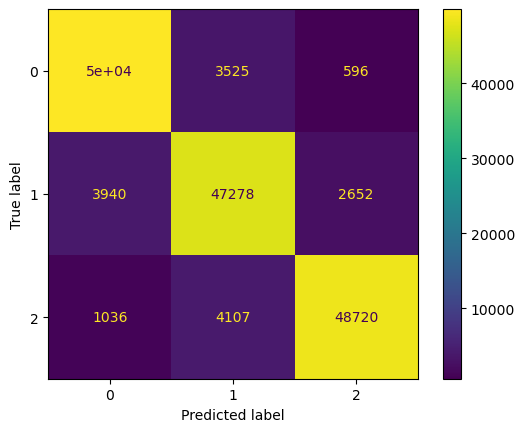

In [152]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(lgr,X_testB,y_testB)

In [149]:
scores["LogisticRegression_Balanced"] = 90

# Naive Bayes : Balanced

In [154]:
clf_B = MultinomialNB()

In [155]:
clf_B=clf_B.fit(X_trainB, y_trainB)  # Fitting the ML model
y_pred_nb = clf_B.predict(X_testB)  # Predicting labels using the fitted model


In [156]:
print('accuracy:', accuracy_score(y_testB, y_pred_nb))
print('recall:', recall_score(y_testB, y_pred_nb, average='weighted'))
print('f1-score:', f1_score(y_testB, y_pred_nb, average='weighted'))
print('precision:', precision_score(y_testB, y_pred_nb, average='weighted'))


accuracy: 0.7466327104594597
recall: 0.7466327104594597
f1-score: 0.7403818606873847
precision: 0.7457433590422297


* Not much difference in the accuracy

# Comparing Models 

In [150]:
scores

{'Naive Bayes': 73,
 'LogisticRegression': 89,
 'DecisionTree': 86,
 'Random Forest': 64,
 'LogisticRegression_Balanced': 90}

In [158]:
scores = {
    'Model': ['Naive Bayes', 'LogisticRegression', 'DecisionTree', 'Random Forest', 'LogisticRegression_Balanced'],
    'Accuracy': [73, 89, 86, 64, 90]}

df = pd.DataFrame(scores)
df

,Model,Accuracy
0,Naive Bayes,73
1,LogisticRegression,89
2,DecisionTree,86
3,Random Forest,64
4,LogisticRegression_Balanced,90


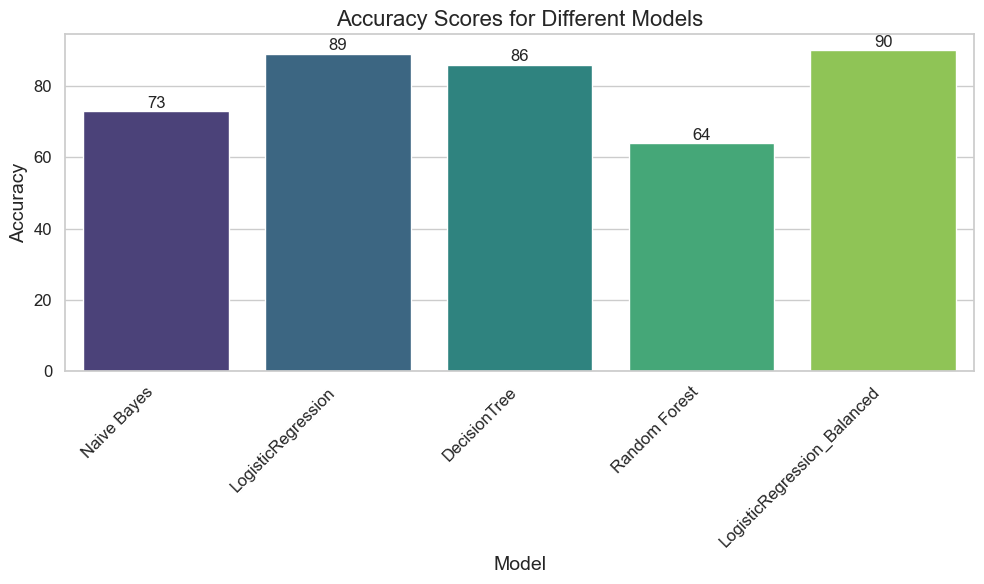

In [160]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
ax = sns.barplot(x="Model", y="Accuracy", data=df, palette="viridis", ci=None)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("Model", fontsize=14)
plt.ylabel("Accuracy", fontsize=14)
plt.title("Accuracy Scores for Different Models", fontsize=16)

# labels above each bar
for index, value in enumerate(df['Accuracy']):
    ax.text(index, value + 1, str(value), ha='center', fontsize=12)

plt.tight_layout()
plt.show()

#### We can see that Logistic Regression have performed the best for the given dataset